# Week3授業前課題1 アヤメを分析しよう

# 1.この課題の目的

- データ分析の基本的な流れを知る
- PandasやMatplotlibに慣れる

# 2.フィッシャーのアヤメ

「フィッシャーのアヤメ」という機械学習やデータ分析の世界で有名なデータセットを使い、基本的なデータの扱い方を学んでいきます。
これはカナダのガスペ半島のある牧草地で同じ日に採取された以下の3種類のアヤメ、合計150本のデータです。

- [Iris setosa - Wikipedia](https://en.wikipedia.org/wiki/Iris_setosa)
- [Iris virgicolor - Wikipedia](https://en.wikipedia.org/wiki/Iris_versicolor)
- [Iris virginica - Wikipedia](https://en.wikipedia.org/wiki/Iris_virginica)

# 3.データセットの準備

scikit-learnという機械学習ライブラリにはirisデータセットが用意されているため、これを使用します。
説明変数として4種類の特徴量、目的変数としてアヤネの種類の番号が記録されています。

## 【課題1】データの取得

以下のドキュメントを参考にしながら、irisデータセット読み込みましょう。
[sklearn.datasets.load_iris — scikit-learn 0.20.2 documentation](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_iris.html)

データが読み込めたら、説明変数を下のようなPandasのDataFrame型変数Xに格納してください。列の名前も以下を参考にしてください。

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# irisデータの読み込み
from sklearn.datasets import load_iris
data = load_iris()

# 説明変数をデータフレームxに格納
X = pd.DataFrame(data['data'],
                 columns=['sepal_length', 'sepal_width', 'petal_length', 'petal_width'])
X.head()

,sepal_length,sepal_width,petal_length,petal_width
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [2]:
# 目的変数をデータフレームyに格納
y = pd.DataFrame(data['target'], columns=['Species'])
y.head()

,Species
0,0
1,0
2,0
3,0
4,0


## 【課題2】データの結合

そして、これらX,yを結合させたDataFrame型変数dfを作成してください。これ以降はこのdfを使っていきます。

In [3]:
# yをxの右端の列に追加する為、join(, ～.how=(～,'right')を指定
df = X.join(y, how='right')

# dfの先頭から５行のみ表示
# 右端の列に「Species」列が追加されており、正常にjoinメソッドが動作したことを確認
df.head()

,sepal_length,sepal_width,petal_length,petal_width,Species
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


# 4.データの概観

## 【課題3】データの確認

今回扱うデータがどのような物なのか、改めて確認します。
少なくとも以下の4点についてコードとマークダウンを組み合わせてレポートしてください。
- 先頭から4番目までのサンプルを表示させ、各特徴量がどういったものかを見る。（数値データか文字データかなど）
- ラベルごとのサンプル数の合計を出力する。
- 特徴量に欠損値があるかを確認する。
- 特徴量の平均値と標準偏差、四分位数を一度に表示させる。

### 先頭から4番目までのサンプルを表示させ、各特徴量がどういったものかを見る。（数値データか文字データかなど）

#### 特徴量の詳細
各特徴量の詳細を説明する。
まずはデータセットの先頭から4行目まで表示する。

In [4]:
df[:4]

,sepal_length,sepal_width,petal_length,petal_width,Species
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0


次にinfo()メソッドを使用し、データの詳細を確認する。

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
sepal_length    150 non-null float64
sepal_width     150 non-null float64
petal_length    150 non-null float64
petal_width     150 non-null float64
Species         150 non-null int64
dtypes: float64(4), int64(1)
memory usage: 5.9 KB


上記より各特徴量はそれぞれ**150個の数値データ**で、データは**数値データ**で、データタイプは**float64**であることがわかる。

### ラベルごとのサンプル数の合計を出力する

各ラベル(目的関数の値)ごとのサンプル数を確認する為、以下に目的変数を表示する。

In [6]:
pd.set_option('display.max_rows', 150) # Species列を全行表示する為、設定変更
print(df['Species'])

0      0
1      0
2      0
3      0
4      0
5      0
6      0
7      0
8      0
9      0
10     0
11     0
12     0
13     0
14     0
15     0
16     0
17     0
18     0
19     0
20     0
21     0
22     0
23     0
24     0
25     0
26     0
27     0
28     0
29     0
30     0
31     0
32     0
33     0
34     0
35     0
36     0
37     0
38     0
39     0
40     0
41     0
42     0
43     0
44     0
45     0
46     0
47     0
48     0
49     0
50     1
51     1
52     1
53     1
54     1
55     1
56     1
57     1
58     1
59     1
60     1
61     1
62     1
63     1
64     1
65     1
66     1
67     1
68     1
69     1
70     1
71     1
72     1
73     1
74     1
75     1
76     1
77     1
78     1
79     1
80     1
81     1
82     1
83     1
84     1
85     1
86     1
87     1
88     1
89     1
90     1
91     1
92     1
93     1
94     1
95     1
96     1
97     1
98     1
99     1
100    2
101    2
102    2
103    2
104    2
105    2
106    2
107    2
108    2
109    2
110    2
1

上記より**ラベルが「0、1、2」の3種類であることが確認**、ラベル数ごとの行数を確認する。

In [7]:
(df['Species']==0).sum()

50

In [8]:
(df['Species']==1).sum()

50

In [9]:
(df['Species']==2).sum()

50

上記より、**各ラベル毎のサンプル数が50個**であることがわかる。

### 特徴量に欠損値があるかを確認する。

In [10]:
# isnullメソッドにて確認 ※列ごとに確認する為 .all()　を追加　(defaultでは列ごとに判定)
df.isnull().all()

sepal_length    False
sepal_width     False
petal_length    False
petal_width     False
Species         False
dtype: bool

上記の結果にて、**全ての特徴量でFalse(欠損値があるかないか？の結果)**の為、**欠損値がない**事を確認。

### 特徴量の平均値と標準偏差、四分位数を一度に表示させる。

describe()メソッドにて確認が可能。
- mean　平均
- std　標準偏差
- 25%　第一四分位数
- 50%　第二四分位数
- 75%　第三四分位数

In [11]:
df.describe()

,sepal_length,sepal_width,petal_length,petal_width,Species
count,150.000000,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333,1.000000
std,0.828066,0.435866,1.765298,0.762238,0.819232
min,4.300000,2.000000,1.000000,0.100000,0.000000
25%,5.100000,2.800000,1.600000,0.300000,0.000000
50%,5.800000,3.000000,4.350000,1.300000,1.000000
75%,6.400000,3.300000,5.100000,1.800000,2.000000
max,7.900000,4.400000,6.900000,2.500000,2.000000


## 【課題4】irisデータセット自体の調査

ページのはじめで「カナダのガスペ半島のある牧草地で」と書きましたが、データセット自体についてもう少し調査しておきましょう。データセットを見る上で、そのデータセット自体について知っておくことも大切です。

### ①用意したデータセットの詳細
今回、参照したデータは総サンプル数150、特徴量4、クラス数(判別する種類)3のデータセットである。

データの内容はアヤメ科アヤメ属の３種類の花をそれぞれ50輪ずつ用意し、花冠(かかん)、花びらのそれぞれの長さと幅を測定したものである。単位(cm)。

#### アヤメ属について
多年草で地下に球茎または根茎がある。葉は剣形でふつう根生し、茎に跨状に互生する。花は両性で、1個または多数の花を総状につける。花被片は6個で、3個の外花被片と3個の内花被片の形が異なる。外花被片は大型で先が広がり下に垂れ、種によっては外花被片の中央部にとさか状の突起があり、内花被片は小型で直立する。花柱は上部が3分枝し、花柱分枝は花弁状になる。雄蕊は3個で外花被片に対生し、花柱分枝の下につく。
世界の温帯に約150種、日本では9種が知られ、うち7種が自生している。

#### 花の専門用語
- corolla(花冠)　→花を構成している花弁の全体。
- Petal(花びら)　→花(正しくは花冠)を構成している花葉。
- Sepal(がく)　→花冠の外側の部分。

以下に具体的なPetal,Sepalの場所を表示する。

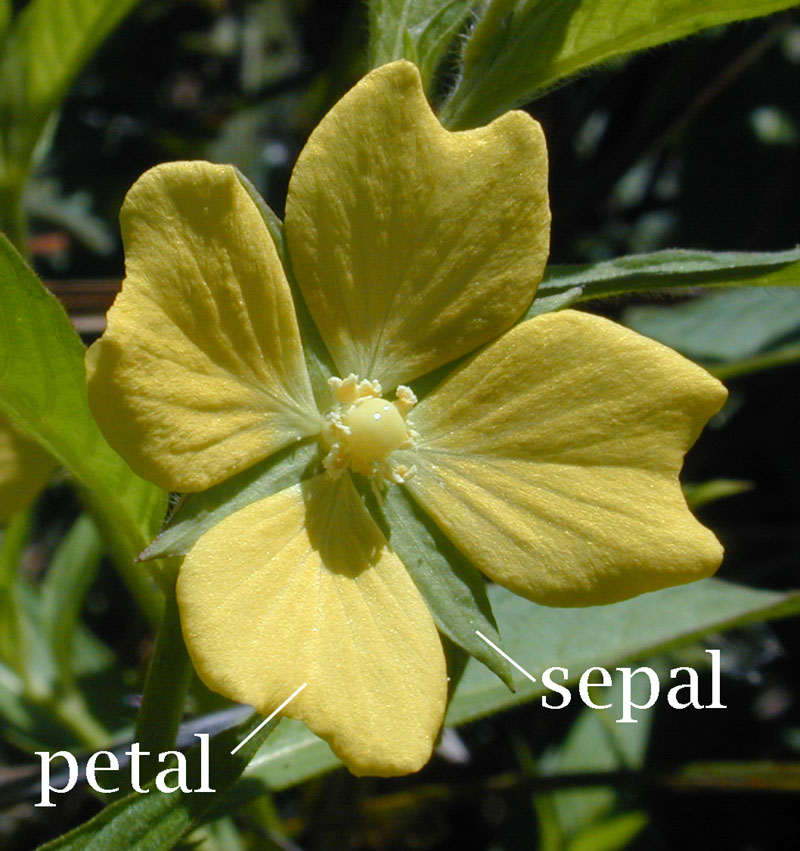

In [12]:
from IPython.display import display
from PIL import Image
display(Image.open('iris.jpg'))

[引用元:wikipedia](https://ja.wikipedia.org/wiki/%E8%90%BC)

**各特徴量の詳細**
- sepal_length　がくの長さ(数値データ、float64)
- sepal_width　がくの幅(数値データ, float64)
- petal_length　花弁の長さ(数値データ、float64)
- petal_width　花弁の幅(数値データ、float64)

**各ラベルの詳細**

ラベルの名前はtarget_namesに格納されている。

In [13]:
data['target_names']

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

### ②各ラベルの花について

### setosa(和名:ひおうぎあやめ　英名: Arctic Iris) 北海道、本州の中部以北に分布し、深山の湿原などに自生する。

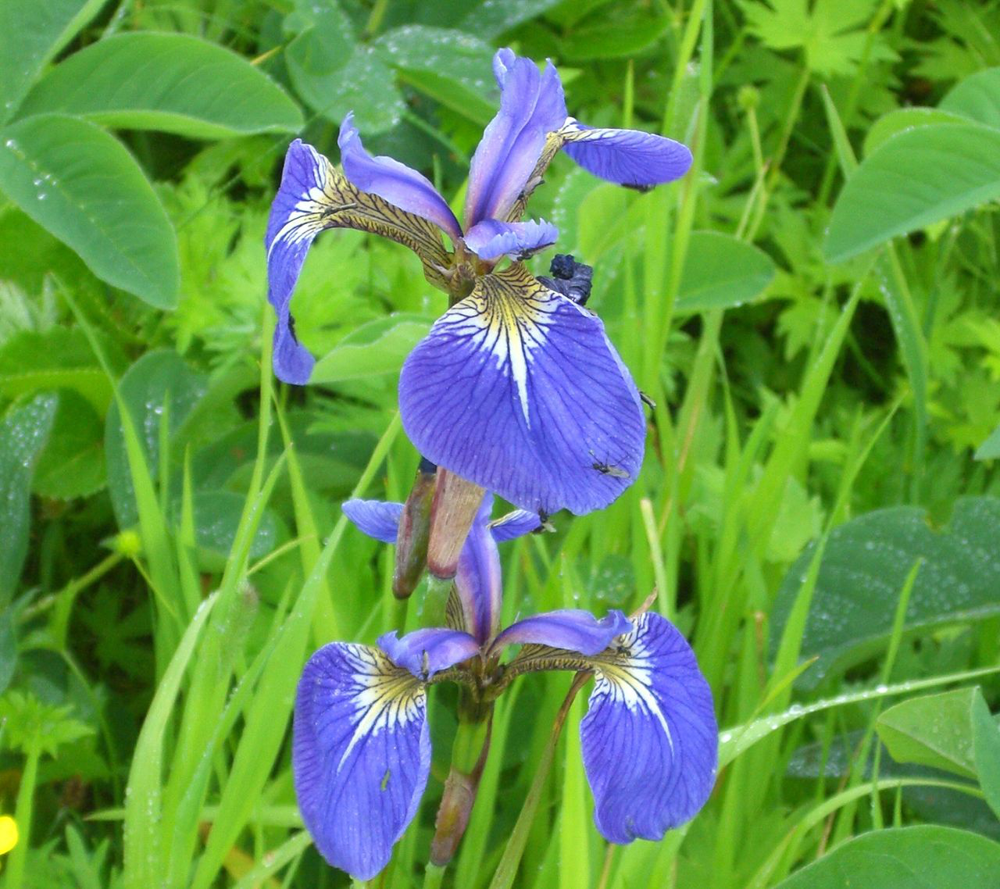

In [14]:
display(Image.open('setosa.jpg'))

### versicolor(英名:Blue flag) アメリカ東部およびカナダ東部の北アメリカ原産の花。

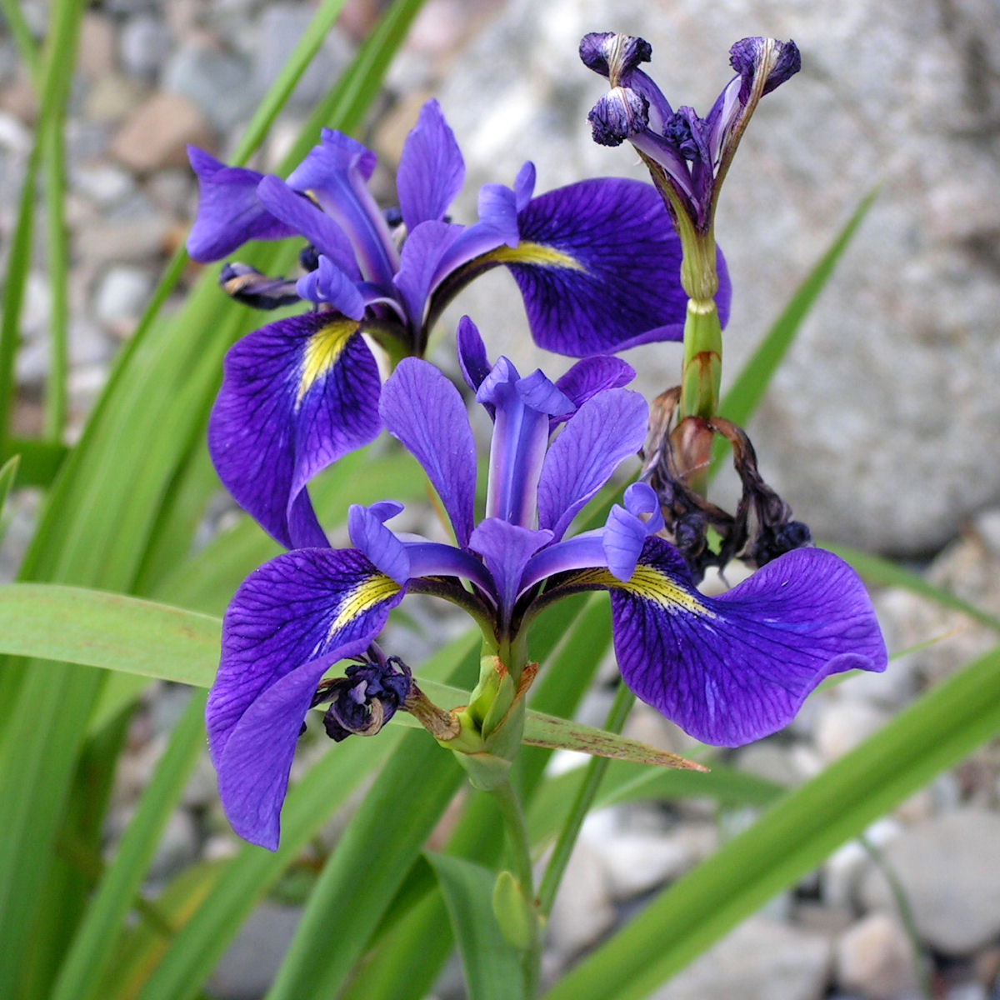

In [15]:
display(Image.open('versicolor.jpg'))

### virginica(英名:virginica)北アメリカ東部に固有の花。

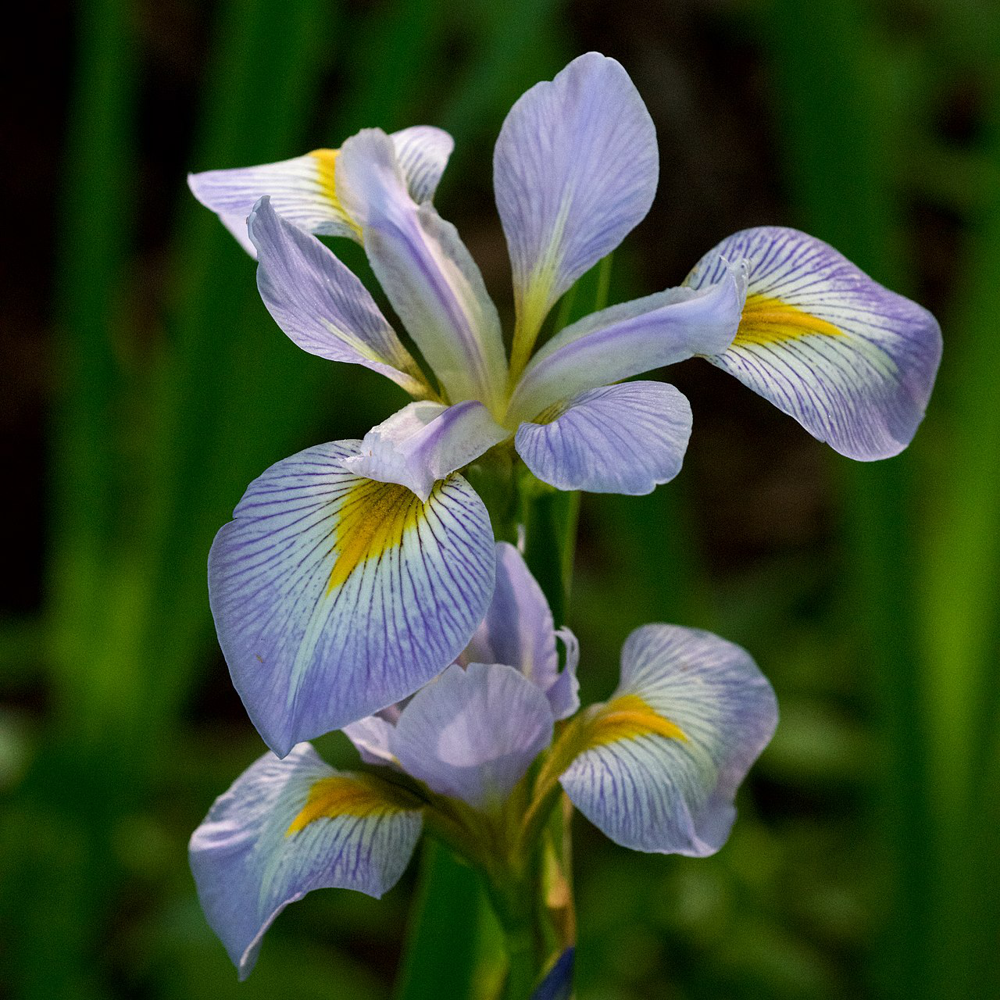

In [16]:
display(Image.open('versinica.jpg'))

# 5.特徴量についての探索

各特徴量や特徴量同士の関係を見ていきます。

## 【課題5】必要なデータを抽出

DataFrameから必要なデータを抽出する方法を確認していきます。

- sepal_widthの列を３つの異なる方法で抽出する
- 50番目から99番目までのデータを抽出する
- petal_lengthの列の50番目から99番目までのデータを抽出する
- petal_widthの値が0.2のデータを抽出する

locや.ilocを使うことになります。この２つはどう違うのかについても説明してください。

### ①sepal_widthの列を３つの異なる方法で抽出する

#### 1. columns名を指定してデータを抽出する方法

In [17]:
# 表示する行が長くなってしまう為、表示する行をデフォルト値に変更
# pd.set_option('display.max_rows', 50) 

In [18]:
df['sepal_width']

0      3.5
1      3.0
2      3.2
3      3.1
4      3.6
5      3.9
6      3.4
7      3.4
8      2.9
9      3.1
10     3.7
11     3.4
12     3.0
13     3.0
14     4.0
15     4.4
16     3.9
17     3.5
18     3.8
19     3.8
20     3.4
21     3.7
22     3.6
23     3.3
24     3.4
25     3.0
26     3.4
27     3.5
28     3.4
29     3.2
30     3.1
31     3.4
32     4.1
33     4.2
34     3.1
35     3.2
36     3.5
37     3.6
38     3.0
39     3.4
40     3.5
41     2.3
42     3.2
43     3.5
44     3.8
45     3.0
46     3.8
47     3.2
48     3.7
49     3.3
50     3.2
51     3.2
52     3.1
53     2.3
54     2.8
55     2.8
56     3.3
57     2.4
58     2.9
59     2.7
60     2.0
61     3.0
62     2.2
63     2.9
64     2.9
65     3.1
66     3.0
67     2.7
68     2.2
69     2.5
70     3.2
71     2.8
72     2.5
73     2.8
74     2.9
75     3.0
76     2.8
77     3.0
78     2.9
79     2.6
80     2.4
81     2.4
82     2.7
83     2.7
84     3.0
85     3.4
86     3.1
87     2.3
88     3.0
89     2.5
90     2.6

#### 2. ilocメソッドを使用する方法(データフレームから行番号、列番号を用いてデータを抽出)

In [19]:
df.iloc[:, 1] # [ ：(全ての行), 1番目の列]を抽出

0      3.5
1      3.0
2      3.2
3      3.1
4      3.6
5      3.9
6      3.4
7      3.4
8      2.9
9      3.1
10     3.7
11     3.4
12     3.0
13     3.0
14     4.0
15     4.4
16     3.9
17     3.5
18     3.8
19     3.8
20     3.4
21     3.7
22     3.6
23     3.3
24     3.4
25     3.0
26     3.4
27     3.5
28     3.4
29     3.2
30     3.1
31     3.4
32     4.1
33     4.2
34     3.1
35     3.2
36     3.5
37     3.6
38     3.0
39     3.4
40     3.5
41     2.3
42     3.2
43     3.5
44     3.8
45     3.0
46     3.8
47     3.2
48     3.7
49     3.3
50     3.2
51     3.2
52     3.1
53     2.3
54     2.8
55     2.8
56     3.3
57     2.4
58     2.9
59     2.7
60     2.0
61     3.0
62     2.2
63     2.9
64     2.9
65     3.1
66     3.0
67     2.7
68     2.2
69     2.5
70     3.2
71     2.8
72     2.5
73     2.8
74     2.9
75     3.0
76     2.8
77     3.0
78     2.9
79     2.6
80     2.4
81     2.4
82     2.7
83     2.7
84     3.0
85     3.4
86     3.1
87     2.3
88     3.0
89     2.5
90     2.6

#### 3. locメソッドを使用する方法(データフレームから行ラベル、列ラベルを用いてデータを抽出)

In [20]:
df.loc[:,['sepal_width']]

,sepal_width
0,3.5
1,3.0
2,3.2
3,3.1
4,3.6
5,3.9
6,3.4
7,3.4
8,2.9
9,3.1


### locとilocの違い

- 行と列の指定の方法
    - locメソッド→　行と列を**index.name** と **columns.name** を用いて指定する。
    - ilocメソッド→　行と列を**index**を用いて指定する。

### ②50番目から99番目までのデータを抽出する

In [21]:
# ilocメソッドにて５０行目〜90行目までのデータを抽出
df.iloc[50:100]

,sepal_length,sepal_width,petal_length,petal_width,Species
50,7.0,3.2,4.7,1.4,1
51,6.4,3.2,4.5,1.5,1
52,6.9,3.1,4.9,1.5,1
53,5.5,2.3,4.0,1.3,1
54,6.5,2.8,4.6,1.5,1
55,5.7,2.8,4.5,1.3,1
56,6.3,3.3,4.7,1.6,1
57,4.9,2.4,3.3,1.0,1
58,6.6,2.9,4.6,1.3,1
59,5.2,2.7,3.9,1.4,1


### ③petal_lengthの列の50番目から99番目までのデータを抽出する

In [22]:
# ilocメソッドにて５０行目〜９０行目までのデータの中で、３列目(petal_length列)を抽出
df.iloc[50:100,2]

50    4.7
51    4.5
52    4.9
53    4.0
54    4.6
55    4.5
56    4.7
57    3.3
58    4.6
59    3.9
60    3.5
61    4.2
62    4.0
63    4.7
64    3.6
65    4.4
66    4.5
67    4.1
68    4.5
69    3.9
70    4.8
71    4.0
72    4.9
73    4.7
74    4.3
75    4.4
76    4.8
77    5.0
78    4.5
79    3.5
80    3.8
81    3.7
82    3.9
83    5.1
84    4.5
85    4.5
86    4.7
87    4.4
88    4.1
89    4.0
90    4.4
91    4.6
92    4.0
93    3.3
94    4.2
95    4.2
96    4.2
97    4.3
98    3.0
99    4.1
Name: petal_length, dtype: float64

### ④petal_widthの値が0.2のデータを抽出する

In [23]:
df[df['petal_width'] == 0.2]

,sepal_length,sepal_width,petal_length,petal_width,Species
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
7,5.0,3.4,1.5,0.2,0
8,4.4,2.9,1.4,0.2,0
10,5.4,3.7,1.5,0.2,0
11,4.8,3.4,1.6,0.2,0
14,5.8,4.0,1.2,0.2,0


## 【課題6】図の作成

データは可視化して確認することが大切です。図を作成していきましょう。Matplotlibやseabornを使ってください。

- ラベルごとのサンプル数を円グラフにする（パーセンテージまで表示する）
- boxplotを使いデータの分布を可視化する
- violinplotを使いデータの分布を可視化する

boxplotとviolinplotは似た図を表示します。これらはどう違い、それぞれどのような利点があるのか説明してください。

### ラベルごとのサンプル数を円グラフにする（パーセンテージまで表示する）

課題[3]にてラベル毎のサンプル数は各50個ずつだと確認した為、
以下のようにサンプル数が格納されているnumpy配列 label を作成する。

### 課題3にてラベルは「0、1、2」の3種類が各50個ずつであることがわかった為、以下のように円グラフを作成する。

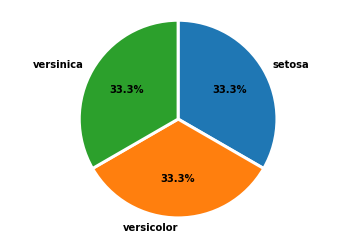

In [27]:
# 50,50,50のnumpy配列xを作成
x = np.array([50, 50, 50])

# 円グラフのラベル名としてリスト label を作成
label = ['setosa', 'versicolor', 'versinica']

# 円グラフを表示 
plt.pie(x, labels = label,
            counterclock=False, startangle=90,
            wedgeprops={'linewidth': 3, 'edgecolor':"white"},
            autopct="%1.1f%%", textprops={'color': "black", 'weight': "bold"})

# 真円に表示するよう設定
plt.axis('equal');

### boxplotを使いデータの分布を可視化する

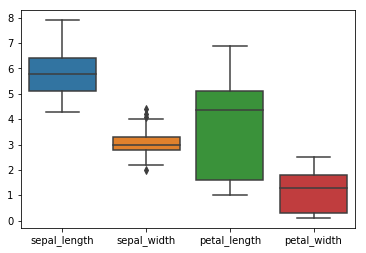

In [28]:
import seaborn as sns # boxplotメソッドを使用する為、seabornライブラリをインポート。

# boxplot図を表示 ※４列目(species列)のみ表示しない為、0〜3列目までを範囲指定
sns.boxplot(data=df.iloc[:,:4]);

### violinplotを使いデータの分布を可視化する

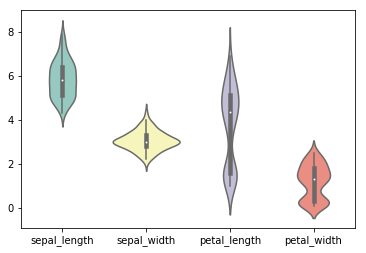

In [31]:
# violinplot図を表示　 ※４列目(species列)のみ表示しない為、0〜3列目までを範囲指定
sns.violinplot(data=df.iloc[:,:4],  dodge=True,
              jitter=False, color='black', palette='Set3');

### boxplotメソッドとviolinplotメソッドのそれぞれの表示される図の違い

#### それぞれのメソッドの説明をする前に、まず**四分位数**について説明する。

四分位数とはデータを値の小さい順にソートした結果を、4等分した際の25%、50%、75%の3つの区切りの値である。

それぞれ第一四分位数、第二四分位数、第三四分位数という。

#### 次に各メソッドにて表示される図の詳細を説明する。

1. boxplotメソッドにて表示される図は**箱ひげ図**が表示される。

    箱ひげ図とは、四分位数を四角い箱と線で表した図である。

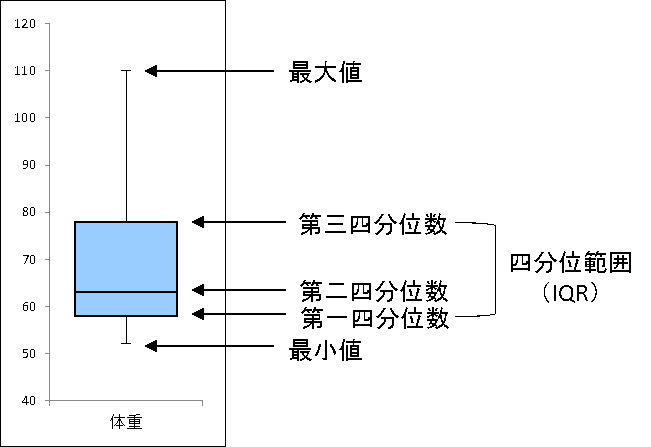

In [32]:
display(Image.open('hakohige.png'))

[画像引用元:統計WEB](https://bellcurve.jp/statistics/course/5220.html)

2. violinplotメソッドにて表示する際にされる図は**バイオリン図**が表示される。
    バイオリン図とは、箱ひげ図にデータの確率密度関数のグラフを90度回転したものを加えた図である。

    つまりバイオリン図のそれぞれの波形が最も盛り上がっている部分の値が、データの中で最も多いデータと確認でき、またその逆に下がっている部分の値は少ないデータであると考えられる。

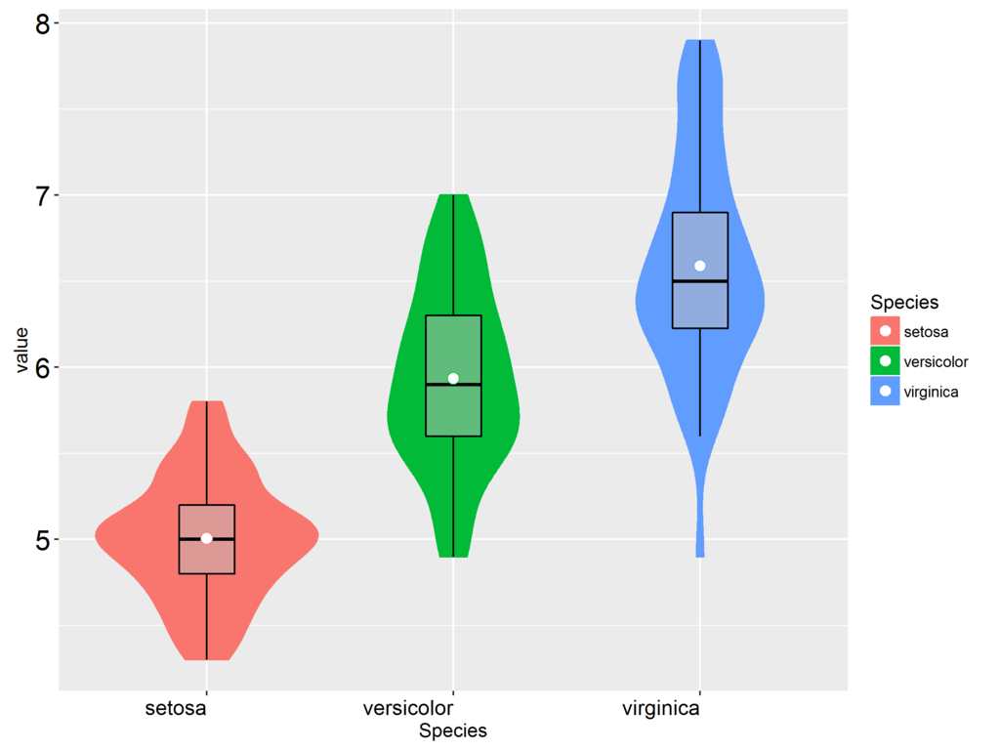

In [33]:
display(Image.open('violin.png'))

# 【課題7】特徴量間の関係の確認

特徴量間の関係を見ていきます。

- 縦軸と横軸に特徴量を１つずつ取り、種類毎に色分けした散布図を作る
- 全ての組み合わせの散布図を一度に表示させる、散布図行列を作る
- ４つの特徴量に関する相関係数行列を作る
- 相関係数行列のヒートマップを作る

### 縦軸と横軸に特徴量を１つずつ取り、種類毎に色分けした散布図を作る

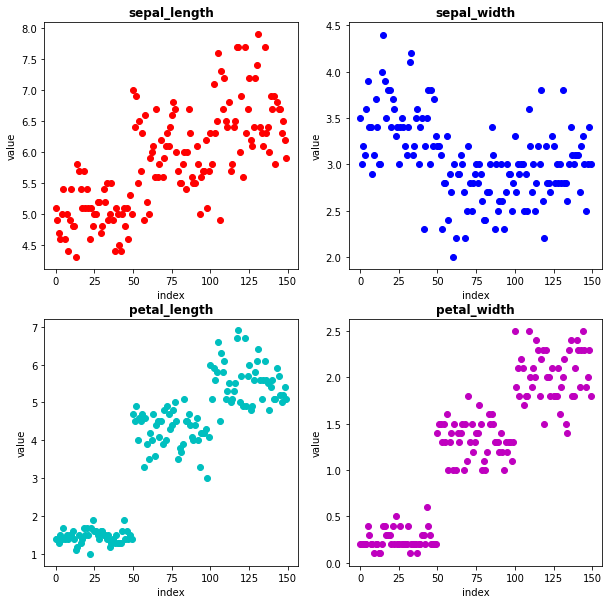

In [35]:
# 特徴量は4個なので、4個のサブプロットを作成。
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

# 左上(0,0)のサブプロットに特徴量「sepal_length」の散布図を表示。
ax[0,0].scatter(x=df.index, y=df['sepal_length'], color='r')
ax[0,0].set_title('sepal_length', fontweight='bold')

# 右上(0,1)のサブプロットに特徴量「sepal_width」の散布図を表示。
ax[0,1].scatter(x=df.index, y=df['sepal_width'], color='b')
ax[0,1].set_title('sepal_width', fontweight='bold')

# 左下(1,0)のサブプロットに特徴量「petal_length」の散布図を表示。
ax[1,0].scatter(x=df.index, y=df['petal_length'], color='c')
ax[1,0].set_title('petal_length', fontweight='bold')

# 左下(1,1)のサブプロットに特徴量「petal_width」の散布図を表示。
ax[1,1].scatter(x=df.index, y=df['petal_width'], color='m');
ax[1,1].set_title('petal_width', fontweight='bold')

# for文を使用し、各サブプロットにxlabel,ylabelを表示
for i in range(2):
    for j in range(2):
        ax[i,j].set_xlabel('index')
        ax[i,j].set_ylabel('value')  

### 全ての組み合わせの散布図を一度に表示させる、散布図行列を作る

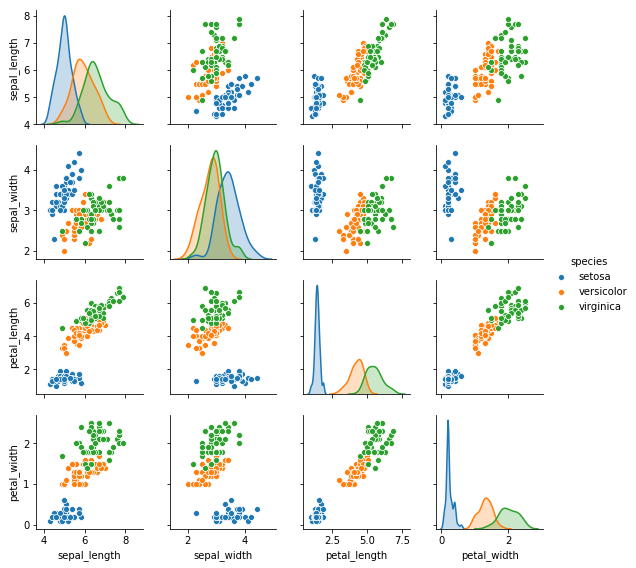

In [41]:
# seabornライブラリのirisデータセットをロード
df2 = sns.load_dataset('iris')

# irisデータセットの散布図行列を表示　(species列の値で色分けするように設定)
sns.pairplot(df2, hue="species", height=2,)
plt.show()

### ４つの特徴量に関する相関係数行列を作る

In [37]:
# Irisデータセットのdataを呼び出し
x = pd.DataFrame(data['data'],
                 columns=['sepal_length', 'sepal_width', 'petal_length', 'petal_width'])

# pandasライブラリのcorrメソッドを呼び出し、パラメータにpearsonを指定し
# (標準)相関係数行列を計算
corr = x.corr(method='pearson')
corr

,sepal_length,sepal_width,petal_length,petal_width
sepal_length,1.000000,-0.117570,0.871754,0.817941
sepal_width,-0.117570,1.000000,-0.428440,-0.366126
petal_length,0.871754,-0.428440,1.000000,0.962865
petal_width,0.817941,-0.366126,0.962865,1.000000


### 相関係数行列のヒートマップを作る

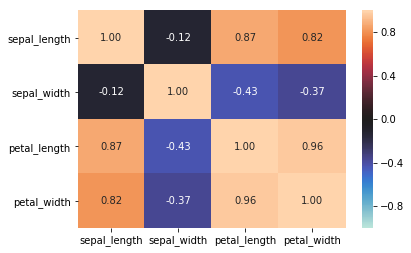

In [38]:
sns.heatmap(corr,
            vmin=-1.0,
            vmax=1.0,
            center=0,
            annot=True, # True:格子の中に値を表示
            fmt='.2f', # テキストの表示形式を小数第2位まで表示するよう指定。
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values
           )
plt.show()

# 【課題8】簡単な考察

データを探索した時には、考察をすることが大切です。散布図行列を見ながら、3種類の花はどういう風に分けられそうかを簡単に考えて説明してください。

#### setosaの特徴量について
1. 他の2つのラベルの特徴量と比較
    - petal_lengthとpetal_widthの両方の値が低く、sepal_widthが高い事がわかる。


2. virginiaのそれぞれの特徴量の相関関係について
    - 

#### versicolorの特徴量について
1. 他の2つのラベルの特徴量と比較
    - petal_lengthとpetal_widthの両方の値が低く、sepal_widthが高い事がわかる。


2. virginiaのそれぞれの特徴量の相関関係について

#### virginiaの特徴量について
1. 他の2つのラベルの特徴量と比較
    - petal_length、petal_widthが高い値となっている


2. virginiaのそれぞれの特徴量の相関関係について
    - petal_lengthとsepal_lengthは正の相関があるように見える